In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import talib


In [2]:
import yfinance as yf 

In [3]:
df = pd.read_csv('BTC-USDT_Hourly chart - Binance_BTCUSDT_1h (1).csv')
# df = pd.read_csv('bitcoin_ohlc_1000vol2.csv')
# df = pd.read_csv('BTC_hourly_2018-2022 - Sheet1.csv')

In [4]:
df2 = df.copy()

In [5]:
#schaff trend cycle
def stc(df):
    df['ema_23c'] = df['close'].ewm(span=23, adjust=False).mean()
    df['ema_50c'] = df['close'].ewm(span=50, adjust=False).mean()
    
#     df['ema_23h'] = df['high'].ewm(span=23, adjust=False).mean()
#     df['ema_50h'] = df['high'].ewm(span=50, adjust=False).mean()
    
    
#     df['ema_23o'] = df['open'].ewm(span=23, adjust=False).mean()
#     df['ema_50o'] = df['open'].ewm(span=50, adjust=False).mean()
    
    
#     df['ema_23l'] = df['low'].ewm(span=23, adjust=False).mean()
#     df['ema_50l'] = df['low'].ewm(span=50, adjust=False).mean()
    
    df['macdc'] = df['ema_23c'] - df['ema_50c']
#     df['macdh'] = df['ema_23h'] - df['ema_50h']
#     df['macdo'] = df['ema_23o'] - df['ema_50o']
#     df['macdl'] = df['ema_23l'] - df['ema_50l']
    
    df['lowl'] = df['macdc'].rolling(10).min()
    
    df['highh'] = df['macdc'].rolling(10).max()
    
    
    df['%d'] =100* ((df['macdc'] - df['lowl'])/(df['highh'] - df['lowl']))
    df['%k'] = df['%d'].rolling(window=3).mean()


    

In [6]:
stc(df2)
# df2 = df2.iloc[9:,]

In [7]:
df2 = df2.dropna()
# df2.head(10)

In [8]:
# Schaff = 100 x (MACD – %K (MACD)) / (%D (MACD) – %K (MACD)).
df2['Schaff'] = 100 * ((df2['macdc'] - df2['%k']) / (df2['%d'] - df2['%k']))

In [9]:
# df2.tail(20)

In [10]:
import plotly.graph_objects as go

import pandas as pd
from datetime import datetime
from plotly.subplots import make_subplots


In [11]:
# fig = go.Figure(data=[go.Candlestick(x=df2['date'],
#                 open=df2['open'],
#                 high=df2['high'],
#                 low=df2['low'],
#                 close=df2['close'])])

# fig.update_layout(xaxis_rangeslider_visible=False)
# fig.show()

In [12]:
df2['ema100'] = df['close'].ewm(span=100, adjust=False).mean()


In [25]:
fig = go.Figure()
# add OHLC trace
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Candlestick(x=df2['date'],
                             open=df2['open'],
                             high=df2['high'],
                             low=df2['low'],
                             close=df2['close'], 
                             showlegend=False))
fig.update_layout(xaxis_rangeslider_visible=False)

fig.add_trace(go.Scatter(x=df2['date'],
                         y=df2['%k'],
                         line=dict(color='blue')
                        ), row=2, col=1)

fig.add_trace(go.Scatter(x=df2['date'],
                         y=df2['%d'],
                         line=dict(color='red', width=1)
                        ), row=2, col=1)

fig.add_trace(go.Scatter(x=df2['date'], 
                         y=df2['ema100'], 
                         opacity=0.7, 
                         line=dict(color='blue', width=2), 
                         name='MA 100'))

fig.update_layout(height=900, width=1200)

In [14]:
# df2['ema100'] = df['close'].ewm(span=100, adjust=False).mean()


In [15]:
df2['returns'] = df2['close'].pct_change()

In [16]:
df2['position'] = np.where(((df2['%k'] > 10 ) & (df2['%k'].shift(1) < 10 ) & (df2['close'] > df2['ema100'])), 1, np.nan)
df2['position'] = np.where(((df2['%k'] < 90 ) &  (df2['%k'].shift(1) > 90 )) , 0, df2['position'])
df2['position'] = df2['position'].shift(1)

# df2['position1'] = np.where(((df2['%k'] > 10 ) & (df2['%k'].shift(1) < 10 ) & (df2['close'] > df2['ema100'])), 1, np.nan)
# df2['position1'] = np.where(((df2['%k'] < 90 ) & (df2['%k'].shift(1) > 90 )) , 0, df2['position1'])
# df2['position1'] = df2['position1'].shift(1)

In [17]:
df2['position'] = df2['position'].fillna(method='ffill')

# df2['position1'] = df2['position1'].fillna(method='ffill')

In [18]:
# df2['position'] = np.where(((df2['%k'] < 90 ) & (df2['%k'].shift(1)> 90 ) & (df2['close'] < df2['ema100'])), -1, df2['position'])
# df2['position'] = np.where(((df2['%k'] >20 ) & (df2['position'].shift(1) ==-1) &  (df2['%k'].shift(1) < 20 )) , 0, df2['position'])


In [19]:
# df2['position'] = df2['position'].shift(1)
# df2['position'] = df2['position'].fillna(method='ffill')


In [20]:
# df2.to_csv('aa2.csv')

In [21]:
df2['strategy_return'] = df2['position']*df2['returns']
df2['strategy_return'] = 1 + df2['strategy_return']
df2['returns'] = 1+df2['returns']

# df2['strategy_return1'] = df2['position1']*df2['returns']
# df2['strategy_return1'] = 1 + df2['strategy_return1']
# df2['returns'] = 1+df2['returns']

In [22]:
df2.tail()

,unix,date,symbol,open,high,low,close,Volume BTC,Volume USDT,tradecount,...,macdc,lowl,highh,%d,%k,Schaff,ema100,returns,position,strategy_return
16146,1654459200000,2022-06-05 20:00:00,BTC/USDT,30036.3,30123.8,29923.7,29929.5,6412.831,192599256.2,76691,...,-8.573056,-83.840022,-8.573056,100.0,100.0,-7.640150e+17,29949.943357,0.996444,0.0,1.0
16147,1654462800000,2022-06-05 21:00:00,BTC/USDT,29929.5,29977.6,29794.6,29947.9,10392.578,310508316.7,105927,...,-2.313404,-80.820618,-2.313404,100.0,100.0,-7.199666e+17,29949.902894,1.000615,0.0,1.0
16148,1654466400000,2022-06-05 22:00:00,BTC/USDT,29948.0,30056.0,29859.5,30005.2,12035.678,360779339.8,118708,...,5.735093,-80.363429,5.735093,100.0,100.0,-6.633303e+17,29950.997887,1.001913,0.0,1.0
16149,1654470000000,2022-06-05 23:00:00,BTC/USDT,30004.5,30035.9,29880.3,29909.9,6591.588,197415661.1,76830,...,8.600402,-74.227559,8.600402,100.0,100.0,-6.431675e+17,29950.184067,0.996824,0.0,1.0
16150,1654473600000,2022-06-06 0:00:00,BTC/USDT,29910.0,30065.8,29876.2,30049.3,7612.315,228274489.9,69091,...,17.245828,-60.335421,17.245828,100.0,100.0,-5.823307e+17,29952.146759,1.004661,0.0,1.0


In [23]:
df2[['cc_returns', 'strategy_returns']] = df2[['returns', 'strategy_return']].cumprod()

# df2[['cc_returns', 'strategy_returns1']] = df2[['returns', 'strategy_return1']].cumprod()


<AxesSubplot:>

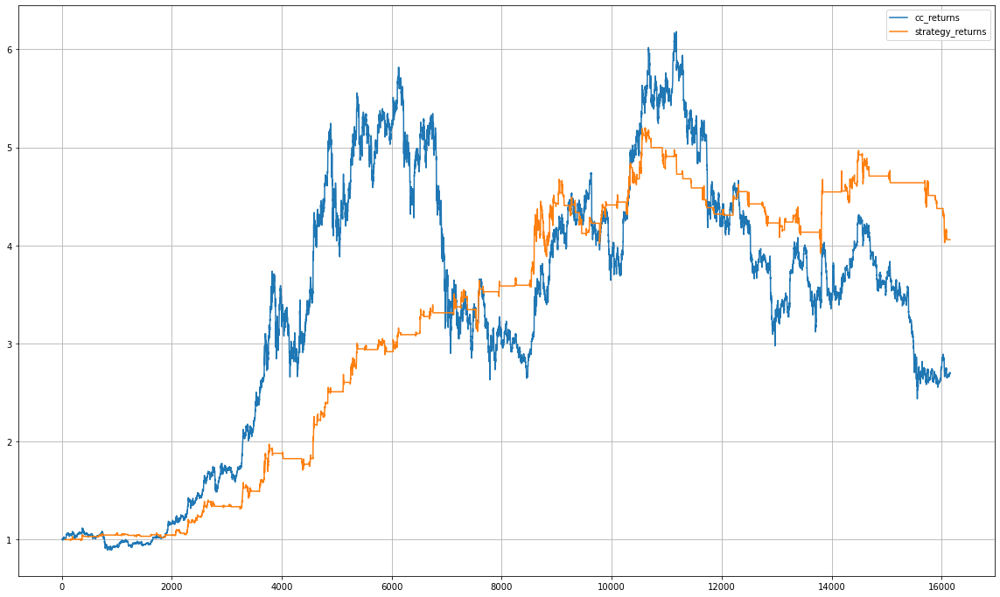

In [24]:
df2[['cc_returns', 'strategy_returns' ]].plot(secondary_y='close', grid=True, figsize=(20, 12))


# df2[['cc_returns', 'strategy_returns1'  , 'strategy_returns']].plot(secondary_y='close', grid=True, figsize=(20, 12))


In [26]:
# df2.set_index('date', inplace=True)
df2.index = df2['date']
df2.head()

,unix,date,symbol,open,high,low,close,Volume BTC,Volume USDT,tradecount,...,highh,%d,%k,Schaff,ema100,returns,position,strategy_return,cc_returns,strategy_returns
date,,,,,,,,,,,,,,,,,,,,,
2020-08-02 13:00:00,1596373200000,2020-08-02 13:00:00,BTC/USDT,11004.13,11141.06,10989.99,11117.65,12483.268,1.383839e+08,39888,...,-30.012669,0.000000,0.000000,-inf,11810.349428,NaN,NaN,NaN,NaN,NaN
2020-08-02 14:00:00,1596376800000,2020-08-02 14:00:00,BTC/USDT,11117.61,11188.00,11067.16,11144.64,11277.325,1.255831e+08,33101,...,-56.373048,0.000000,0.000000,-inf,11797.167064,1.002428,NaN,NaN,1.002428,NaN
2020-08-02 15:00:00,1596380400000,2020-08-02 15:00:00,BTC/USDT,11144.64,11161.17,11083.00,11093.91,7284.595,8.105033e+07,24302,...,-77.536967,0.000000,0.000000,-inf,11783.241181,0.995448,NaN,NaN,0.997865,NaN
2020-08-02 16:00:00,1596384000000,2020-08-02 16:00:00,BTC/USDT,11093.91,11224.09,11071.00,11212.89,11979.151,1.336934e+08,34616,...,-94.804219,0.000000,0.000000,-inf,11771.947098,1.010725,NaN,NaN,1.008567,NaN
2020-08-02 17:00:00,1596387600000,2020-08-02 17:00:00,BTC/USDT,11212.89,11297.98,11181.94,11273.28,13291.767,1.493906e+08,38610,...,-111.365674,1.266557,0.422186,-2.464619e+04,11762.072502,1.005386,NaN,NaN,1.013998,NaN


In [27]:
df2.head()

,unix,date,symbol,open,high,low,close,Volume BTC,Volume USDT,tradecount,...,highh,%d,%k,Schaff,ema100,returns,position,strategy_return,cc_returns,strategy_returns
date,,,,,,,,,,,,,,,,,,,,,
2020-08-02 13:00:00,1596373200000,2020-08-02 13:00:00,BTC/USDT,11004.13,11141.06,10989.99,11117.65,12483.268,1.383839e+08,39888,...,-30.012669,0.000000,0.000000,-inf,11810.349428,NaN,NaN,NaN,NaN,NaN
2020-08-02 14:00:00,1596376800000,2020-08-02 14:00:00,BTC/USDT,11117.61,11188.00,11067.16,11144.64,11277.325,1.255831e+08,33101,...,-56.373048,0.000000,0.000000,-inf,11797.167064,1.002428,NaN,NaN,1.002428,NaN
2020-08-02 15:00:00,1596380400000,2020-08-02 15:00:00,BTC/USDT,11144.64,11161.17,11083.00,11093.91,7284.595,8.105033e+07,24302,...,-77.536967,0.000000,0.000000,-inf,11783.241181,0.995448,NaN,NaN,0.997865,NaN
2020-08-02 16:00:00,1596384000000,2020-08-02 16:00:00,BTC/USDT,11093.91,11224.09,11071.00,11212.89,11979.151,1.336934e+08,34616,...,-94.804219,0.000000,0.000000,-inf,11771.947098,1.010725,NaN,NaN,1.008567,NaN
2020-08-02 17:00:00,1596387600000,2020-08-02 17:00:00,BTC/USDT,11212.89,11297.98,11181.94,11273.28,13291.767,1.493906e+08,38610,...,-111.365674,1.266557,0.422186,-2.464619e+04,11762.072502,1.005386,NaN,NaN,1.013998,NaN


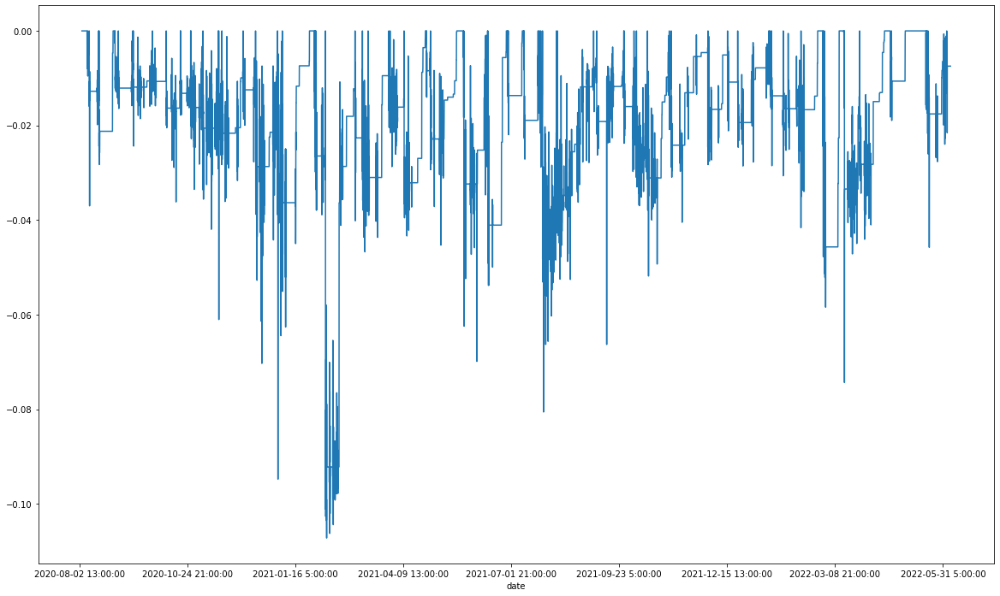

In [28]:
import pandas_datareader as  web
import datetime
SPY_Dat = web.DataReader('SPY', 'yahoo', datetime.date(2007,1,1))

# We are going to use a trailing 252 trading day window
window = 252

# Calculate the max drawdown in the past window days for each day in the series.
# Use min_periods=1 if you want to let the first 252 days data have an expanding window
# Roll_Max = SPY_Dat['Adj Close'].rolling(window, min_periods=1).max()
# Daily_Drawdown = SPY_Dat['Adj Close']/Roll_Max - 1.0

# # Next we calculate the minimum (negative) daily drawdown in that window.
# # Again, use min_periods=1 if you want to allow the expanding window
# Max_Daily_Drawdown = Daily_Drawdown.rolling(window, min_periods=1).min()

# # Plot the results
# Daily_Drawdown.plot()
# Max_Daily_Drawdown.plot()
# plt.show()

Roll_Max = df2['strategy_return'].rolling(window, min_periods=1).max()
Daily_Drawdown = df2['strategy_return']/Roll_Max - 1.0
Max_Daily_Drawdown = Daily_Drawdown.rolling(window, min_periods=1).min()

Daily_Drawdown.plot(figsize = (20,12))
# Max_Daily_Drawdown.plot()

plt.show()

In [29]:
print(min(Daily_Drawdown.dropna())*100, '%') 


-10.719956506226024 %


In [30]:
print(df2['strategy_returns'][-1:,])

date
2022-06-06 0:00:00    4.058668
Name: strategy_returns, dtype: float64
